# ProDy
## 10/03/2023

Original slides courtesy Ahmet Bakan

<a href="?print-pdf">print view</a>

In [1]:
%%html
<script src="https://bits.csb.pitt.edu/preamble.js"></script>

In [2]:
%%html
<div id="newsecstruct" style="width: 500px"></div>
<script>
$('head').append('<link rel="stylesheet" href="https://bits.csb.pitt.edu/asker.js/themes/asker.default.css" />');

    var divid = '#newsecstruct';
	jQuery(divid).asker({
	    id: divid,
	    question: "Which is not an example of protein secondary structure??",
		answers: ["Twist","Helix","Sheet","Coil"],
        server: "https://bits.csb.pitt.edu/asker.js/example/asker.cgi",
		charter: chartmaker})
    
$(".jp-InputArea .o:contains(html)").closest('.jp-InputArea').hide();


</script>

ProDy stands for **Pro**tein **Dy**namics,

* an API that is very suitable for interactive usage 
* comes with several command line applications

ProDy is designed for normal mode analysis, but also is

* a powerful tool for handling macromolecular structures
* useful for analysis of molecular dynamics trajectories
* useful for sequence conservation and coevolution analysis (*Evol*)

This lecture contains:

  * an into to some ProDy conventions
  * handling protein structure files
  * an intro to some dynamics calculations
  * some ProDy design principles
 

## Import from ProDy

In interactive sessions, the following is safe (no name conflicts)

In [3]:
from prody import *
checkUpdates()

C:\Users\mertg\anaconda3\lib\site-packages\Bio\pairwise2.py:278: BiopythonDeprecationWarning: Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.
  warnings.warn(
@> ProDy v2.4.1 is available, you are using 2.3.1.


When developing software, prefer importing specific functions/classes or prefixing

In [4]:
import prody as pd
from prody import parsePDB

## ProDy API naming conventions

### Function names

ProDy functions start with an action verb followed by one or more names or an abbreviation/extension, i.e. **doSomething**:

  * `parseEXT()`: parse a file in EXT format, e.g. `parsePDB`, `parseDCD`
  * `writeEXT()`: write a file in EXT format, e.g. `writePDB`, `writeDCD`
  * `fetchSTH()`: download a file, e.g. `fetchPDB`, `fetchMSA`
  * `calcSTH()`: calculate something, e.g. `calcRMSD`, `calcGyradius`, `calcANM`
  * `showSTH()`: show a plotting of something, e.g. `showCrossCorrelations`, `showProtein`
  * `saveSTH()`: save a ProDy object instance to disk, e.g. `saveAtoms`
  * `loadSTH()`: save a ProDy object instance to disk, e.g. `loadAtoms`

### Class names

Class names start with upper case letters and are abbreviations or words in camel case style, e.g. `AtomGroup`, `Selection`, `ANM`, etc. 

### Class method names

Class method naming is similar to function naming:

* `Class.numSomething`: return number of the thing, e.g. `AtomGroup.numAtoms` returns number of atoms
* `Class.getSomething`: return an attribute, e.g. `AtomGroup.getNames` returns atom names
* `Class.setSomething`: set/update an attribute, e.g. `AtomGroup.setNames` sets atom names
* `Class.buildMatrix`: builds a matrix, e.g. `PCA.buildCovariance` calculates covariance matrix

### Usage example

In [5]:
ubi = parsePDB('1ubi')

@> PDB file is found in working directory (1ubi.pdb.gz).
@> 683 atoms and 1 coordinate set(s) were parsed in 0.01s.


In [6]:
ubi

<AtomGroup: 1ubi (683 atoms)>

**TIP**: to see a list of available functions, just type the action word (calc, show, get, etc.), and use TAB completion.


In [7]:
ubi.numAtoms()

683

In [8]:
calcGyradius(ubi)

12.085104173005442

# Visualization

<Axes3D:xlabel='x', ylabel='y'>

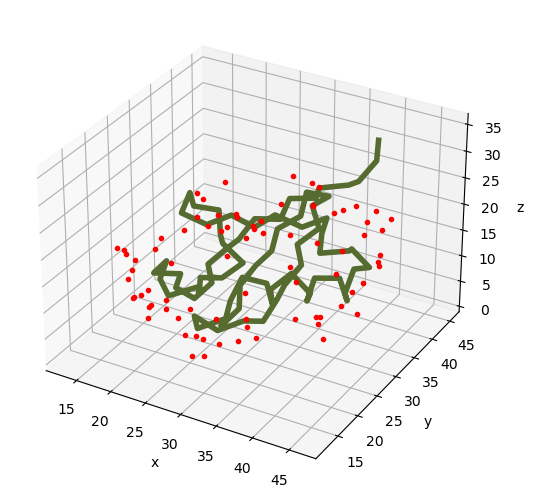

In [9]:
%matplotlib inline
showProtein(ubi)

# Better Visualization

In [10]:
import py3Dmol
showProtein(ubi)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [11]:
%%html
<div id="newatomcnt" style="width: 500px"></div>
<script>
$('head').append('<link rel="stylesheet" href="https://bits.csb.pitt.edu/asker.js/themes/asker.default.css" />');

    var divid = '#newatomcnt';
	jQuery(divid).asker({
	    id: divid,
	    question: "How many atoms does PDB 3ERK have?",
		answers: ["1023","2849","3016","4872"],
        server: "https://bits.csb.pitt.edu/asker.js/example/asker.cgi",
		charter: chartmaker})
    
$(".jp-InputArea .o:contains(html)").closest('.jp-InputArea').hide();


</script>

# File handling

ProDy has a custom format for directly saving atom groups.

In [12]:
saveAtoms(ubi)

'1ubi.ag.npz'

Can also read/write standard protein formats (PDB,PQR)

In [13]:
writePDB('ubi.pdb', ubi)

'ubi.pdb'

In [14]:
parsePDB(writePDB('ubi.pdb', ubi))

@> 683 atoms and 1 coordinate set(s) were parsed in 0.01s.


<AtomGroup: ubi (683 atoms)>

## Structures and `AtomGroups`

Protein Data Bank (PDB) Structure files can be parsed using `parsePDB`. For a given PDB identifier, this function will download the file if needed.

In [15]:
ag = parsePDB('1vrt')

@> PDB file is found in working directory (1vrt.pdb.gz).
@> 7953 atoms and 1 coordinate set(s) were parsed in 0.07s.


Structure data parsed from the file is stored in an `AtomGroup` instance:

In [16]:
type(ag)

prody.atomic.atomgroup.AtomGroup

Why `AtomGroup`?
  * not `Molecule`, because structures are usually made up from multiple molecules
  * not `Structure`, because PDB format is sometimes used for storing small-molecules
  
`AtomGroup` made sense for handling bunch of atoms, and is used by some other packages too.

## Some `AtomGroup` methods

Check number of atoms and models (coordinate sets)

In [17]:
ag.numAtoms()

7953

In [18]:
ag.numCoordsets()

1

# Getters

Use `getSomething` methods to access data parsed from the file

In [19]:
names = ag.getNames()

In [20]:
names

array(['N', 'CA', 'C', ..., 'O', 'O', 'O'], dtype='<U6')

In [21]:
len(names)

7953

In [22]:
print(names[0])

N


In [23]:
ag.getBetas()

array([86.04, 85.23, 84.2 , ..., 64.55, 58.23, 46.98])

Note that `get` is followed by a plural name, and method returns a **numpy array**

# Setters

Use `setSomething` methods to set attributes, but don't forget to pass an array or list with length equal to number of atoms

In [24]:
zeros = [0] * len(ag) # same as ag.numAtoms()
ag.setBetas(zeros)

In [25]:
ag.getBetas()

array([0., 0., 0., ..., 0., 0., 0.])

## `Atom` instances

You can get a handle for specific atoms by indexing

In [26]:
a0 = ag[0]
print(a0)

Atom N (index 0)


Note that `getSomething` and `setSomething` methods are available, but that thing is in singular form:

In [27]:
a0.getName()

'N'

In [28]:
a0.getBeta() # we had just set it to zero

0.0

## Subset of atoms

Slicing an `AtomGroup` will return a handler called `Selection` for specified subset of atoms. Let's get every other atom:

In [29]:
eoa = ag[::2] # eoa: every other atom
print(eoa)

Selection 'index 0:7953:2'


In [30]:
print(len(eoa))
print(len(ag))

3977
7953


`get` and `set` methods in plural form are also available for `Selection` instances

In [31]:
eoa.getNames()

array(['N', 'C', 'CB', ..., 'O', 'O', 'O'], dtype='<U6')

## Hierarchical Views

Macromolecules have a hierarchical structure:

  * chain - a polypeptide or a nucleic acid chain
  * residue - an amino acid, nucleotide, small molecule, or an ion
  * atom - lowest level of hierarchy
  * segment - used by simulation programs and may be composed of multiple chains


In [32]:
ag.numChains()

2

In [33]:
ag.numResidues()

1233

In [34]:
showProtein(ag)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

### Iterations

In [35]:
for ch in ag.iterChains():
    print('%s - %d residues' % (str(ch), ch.numResidues()))

Chain A - 688 residues
Chain B - 545 residues


In [36]:
for ch in ag.iterChains():
    print(ch)
    for res in ch:
        print(' |-%s' % res)
        break
    print('...')

Chain A
 |-PRO 4
...
Chain B
 |-ILE 5
...


Also `iterAtoms` (default), `iterBonds`, `iterCoordsets`, `iterFragments`, `iterResidues`, `iterSegments`

# Indexing

Index with chain identifier to get a chain instance:

In [37]:
chA = ag['A']
print(chA)
type(chA)

Chain A


prody.atomic.chain.Chain

Index with a pair of chain identifier and residue number to get a handle for a residue:

In [38]:
chA_res10 = ag['A', 10]
print(chA_res10)
type(chA_res10)

VAL 10


prody.atomic.residue.Residue

Of course, plural forms of `get` and `set` methods and other methods are available:

In [39]:
chA_res10.getNames()

array(['N', 'CA', 'C', 'O', 'CB', 'CG1', 'CG2'], dtype='<U6')

In [40]:
chA_res10.numAtoms()

7

In [41]:
%%html
<div id="resname" style="width: 500px"></div>
<script>
$('head').append('<link rel="stylesheet" href="https://bits.csb.pitt.edu/asker.js/themes/asker.default.css" />');

    var divid = '#resname';
	jQuery(divid).asker({
	    id: divid,
	    question: "What is residue 12 of 3ERK?",
		answers: ["VAL","ALA","PHE","ARG"],
        server: "https://bits.csb.pitt.edu/asker.js/example/asker.cgi",
		charter: chartmaker})
    
$(".jp-InputArea .o:contains(html)").closest('.jp-InputArea').hide();


</script>

## Atom Selections

The atom selection engine is what makes ProDy a powerful tool. Selection grammar is similar to that of VMD but with added flexibility of Python. `AtomGroup.select` method accepts selection arguments and returns a `Selection` instance:

In [42]:
sel = ag.select('protein and name CA')
print(sel)
print('# of atoms: %d' % sel.numAtoms())
set(sel.getNames())

Selection 'protein and name CA'
# of atoms: 925


{'CA'}

Same as using the keyword 'ca' or 'calpha'

In [43]:
ag.select('ca') == ag.select('calpha') == ag.select('protein and name CA')

True

# Selecting by distance

You can make proximity based selections:

In [44]:
kinase = parsePDB('3erk')
bindingsite = kinase.select('within 5 of (hetero and not water)')
print('# of atoms: %d' % bindingsite.numAtoms())
print(set(bindingsite.getResnames()))

@> PDB file is found in working directory (3erk.pdb.gz).
@> 3016 atoms and 1 coordinate set(s) were parsed in 0.04s.


# of atoms: 98
{'LYS', 'CYS', 'ALA', 'SER', 'ILE', 'GLN', 'MET', 'HOH', 'SB4', 'ASP', 'LEU', 'VAL'}


`exwithin` excludes the initial selection

In [45]:
noligand = kinase.select('exwithin 5 of (hetero and not water)')
print('# of atoms: %d' % noligand.numAtoms())
print(set(noligand.getResnames()))

# of atoms: 73
{'LYS', 'CYS', 'ALA', 'SER', 'ILE', 'GLN', 'MET', 'HOH', 'ASP', 'LEU', 'VAL'}


In [46]:
%%html
<div id="withincnt" style="width: 500px"></div>
<script>
$('head').append('<link rel="stylesheet" href="https://bits.csb.pitt.edu/asker.js/themes/asker.default.css" />');

    var divid = '#withincnt';
	jQuery(divid).asker({
	    id: divid,
	    question: "How many non-water protein atoms are there within 5A of SB4?",
		answers: ["67","70","73","78"],
        server: "https://bits.csb.pitt.edu/asker.js/example/asker.cgi",
		charter: chartmaker})
    
$(".jp-InputArea .o:contains(html)").closest('.jp-InputArea').hide();


</script>

# Keyword arguments

Words used within the selection string that are not reserved keywords can be substituted with keyword arguments.

Select atoms that are close to a point in space:

In [47]:
import numpy as np
origin = np.zeros(3)
print(origin)
sel = ag.select('within 10 of origin', origin=origin)
sel

[0. 0. 0.]


<Selection: 'index 3426 to 3437 3439 to 3461' from 1vrt (35 atoms)>

In [48]:
calcDistance(sel, origin)[:5]

array([9.93856378, 9.16952812, 9.08634382, 9.79169985, 8.45576029])

In [49]:
ag.select('within 5 of center',center = calcCenter(ag))

<Selection: 'index 4457 to 4...49 to 7353 7941' from 1vrt (19 atoms)>

# Dot selection shorthand

Dot operator can also be used to make selections:

In [50]:
ag.calpha

<Selection: 'calpha' from 1vrt (925 atoms)>

In [51]:
ag.name_CA_and_resname_ALA

<Selection: 'name CA and resname ALA' from 1vrt (37 atoms)>

See full documentation of selection grammar at: https://prody.csb.pitt.edu/manual/reference/atomic/select.html

## Coordinate Sets

`AtomGroup` can handle multiple models in a PDB file. Models are called coordinate sets.

In [52]:
ubi = parsePDB('2k39')

@> PDB file is found in working directory (2k39.pdb.gz).
@> 1231 atoms and 116 coordinate set(s) were parsed in 0.28s.


In [53]:
ubi.numCoordsets()

116

*Active coordinate set* (ACS) can be queried or changed using `getACSIndex` and `setACSIndex` methods:

In [54]:
ubi.getACSIndex()

0

# Coordinates

Coordinates are `numpy` arrays

In [55]:
coords = ubi.getCoords()
coords.mean(axis=0)

array([26.02865475, 25.60081316, 20.56833875])

In [56]:
ubi.setACSIndex(115)
ubi.getCoords().mean(axis=0)

array([26.49875061, 26.09516897, 20.5057498 ])

`Selection`s have their own active coordinate set indices:

In [57]:
ubi_ca = ubi.calpha
ubi_ca.getACSIndex()

115

In [58]:
ubi_ca.setACSIndex(0)
print(ubi_ca.getACSIndex())
print(ubi.getACSIndex())

0
115


## Operations with Atoms

### Copying atoms

Call `copy` method to make a copy of `AtomGroup` or `Selection` instance

In [59]:
ag.copy()

<AtomGroup: 1vrt (7953 atoms)>

In [60]:
ca = ag.select('ca')
ca.copy()

<AtomGroup: 1vrt Selection 'ca' (925 atoms)>

# `AtomGroup` addition

Lot's of customization has gone into ProDy classess handling atoms. Addition of `AtomGoup`s (`__add__`) results in a new `AtomGroup`:

In [61]:
ag_copy = ag.copy()
moveAtoms(ag_copy, by=np.array([50, 50, 50]))
ag_copy['A'].setChid('C')
ag_copy['B'].setChid('D')
ag_new = ag + ag_copy
showProtein(ag_new)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

# `AtomGroup` membership

You can use **`in`** to see whether a `Selection` is in another one (enabled by implementing `Selection.__contains__()` method):

In [62]:
ag.calpha in ag.backbone

True

In [63]:
ag.backbone in ag.protein

True

In [64]:
ag.water in ag.protein

False

In [65]:
ag.water in ag

True

# `Selection` operations

You can use bitwise operations on selections as follows:

In [66]:
chA = ag.chain_A
chB = ag.chain_B

In [67]:
print(chA & chB) # intersection

None


In [68]:
sel = chA | chB # union

In [69]:
sel.getSelstr()

'(chain A) or (chain B)'

In [70]:
~chA #not

<Selection: 'not (chain A)' from 1vrt (3461 atoms)>

# Store Data in `AtomGroup`

You can store arbitrary atomic data in `AtomGroup` class and make it persistent on disk:

In [71]:
atoms = parsePDB('1p38')
atoms.getResnums()

@> PDB file is found in working directory (1p38.pdb.gz).
@> 2962 atoms and 1 coordinate set(s) were parsed in 0.03s.


array([  4,   4,   4, ..., 771, 773, 776])

In [72]:
resnum_fract = atoms.getResnums() / 10.
resnum_fract

array([ 0.4,  0.4,  0.4, ..., 77.1, 77.3, 77.6])

In [73]:
atoms.setData('resnumfract', resnum_fract)
atoms.getData('resnumfract')

array([ 0.4,  0.4,  0.4, ..., 77.1, 77.3, 77.6])

# Saving to Files

In [74]:
saveAtoms(atoms)

'1p38.ag.npz'

In [75]:
atoms = loadAtoms('1p38.ag.npz')
atoms.getData('resnumfract')

@> Atom group was loaded in 0.03s.


array([ 0.4,  0.4,  0.4, ..., 77.1, 77.3, 77.6])

# PDB Access

### Fetch PDB files

Can request multiple files at once.  Will download to local directory.

In [76]:
fetchPDB('1p38', '1r39', '@!~#') # searches working directory, local resources, then downloads

@> WARNING '@!~#' is not a valid identifier.


['1p38.pdb.gz', '1r39.pdb.gz', None]

In [77]:
fetchPDBviaHTTP('1p38')
fetchPDBviaFTP('1p38')

@> 1p38 downloaded (C:\Users\mertg\...\1p38.pdb.gz)
@> PDB download via HTTP completed (1 downloaded, 0 failed).
@> Connecting wwPDB FTP server RCSB PDB (USA).
@> pdb1p38.ent.gz download failed. 1p38 does not exist on ftp.wwpdb.org.
@> PDB download via FTP completed (0 downloaded, 1 failed).


# Comparing and Aligning Structures

In [78]:
p38 = parsePDB('1p38')
bound = parsePDB('1zz2')

@> PDB file is found in working directory (1p38.pdb.gz).
@> 2962 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> PDB file is found in working directory (1zz2.pdb.gz).
@> 2872 atoms and 1 coordinate set(s) were parsed in 0.02s.


In [79]:
showProtein(p38, bound)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Chain matching and RMSD

`matchChains` tries to match chains by sequence.  Returns a list of all pairwise matches

In [80]:
apo_chA, bnd_chA, seqid, overlap = matchChains(p38, bound)[0]
print(bnd_chA)
print(seqid)
print(overlap)

@> WARNING no one-letter mapping found for <Residue: HOH 500 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 501 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 502 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 503 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 504 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 505 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 506 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 507 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 508 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 509 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found f

@> WARNING no one-letter mapping found for <Residue: HOH 700 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 701 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 705 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 708 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 710 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 711 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 713 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 716 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 717 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 718 from Chain A from 1p38 (1 atoms)> 
@> WARNING no one-letter mapping found f

@> WARNING no one-letter mapping found for <Residue: HOH 403 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 404 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 405 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 406 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 407 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 408 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 409 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 410 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 411 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found for <Residue: HOH 412 from Chain A from 1zz2 (1 atoms)> 
@> WARNING no one-letter mapping found f

AtomMap Chain A from 1zz2 -> Chain A from 1p38
99.5475113122172
92.08333333333333


Match is alpha carbon only

In [81]:
print(len(apo_chA),len(bnd_chA),len(p38),len(bound))

337 337 2962 2872


In [82]:
set(apo_chA.getNames())

{'CA'}

In [83]:
calcRMSD(apo_chA, bnd_chA)

72.93023086946586

# Align chains

`superpose(mobile, target)`

 * Finds minimal RMSD pose of mobile with respect to target

In [84]:
bnd_chA, transformation = superpose(bnd_chA, apo_chA)
calcRMSD(bnd_chA, apo_chA)

@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


1.862801490869549

In [85]:
showProtein(p38, bound)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

# Building Biomolecules

PDB files often contain monomer coordinates, when the structure of the multimer can be obtained using symmetry operations.  Let’s use some ProDy function to build tetrameric form of KcsA potassium channel:

In [86]:
# parse the monomer structure and PDB file header information
# the header includes transformations for forming tetramer
monomer, header = parsePDB('1k4c', header=True)
monomer

@> PDB file is found in working directory (1k4c.pdb.gz).
@> 4534 atoms and 1 coordinate set(s) were parsed in 0.04s.


<AtomGroup: 1k4c (4534 atoms)>

In [87]:
showProtein(monomer, legend=True)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

# Building Biomolecules

In [88]:
without_K = monomer.not_name_K
without_K

<Selection: 'not name K' from 1k4c (4527 atoms)>

In [89]:
tetramer = buildBiomolecules(header, without_K)
tetramer

<AtomGroup: 1k4c Selection 'not name K' biomolecule 1 (18108 atoms)>

In [90]:
showProtein(tetramer)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol